<a href="https://colab.research.google.com/github/benjacd/Trabajo1_IA/blob/main/Trabajo_1IA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Import librerias basicas
import tensorflow as tf 
import tensorflow_datasets as tfds #De donde sacaremos el dataset

datos, metadatos = tfds.load('tf_flowers', as_supervised = True, with_info = True) #Se carga en las variables datos y metadatos el set

In [ ]:
metadatos

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/root/tensorflow_datasets/tf_flowers/3.0.1',
    file_format=tfrecord,
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)

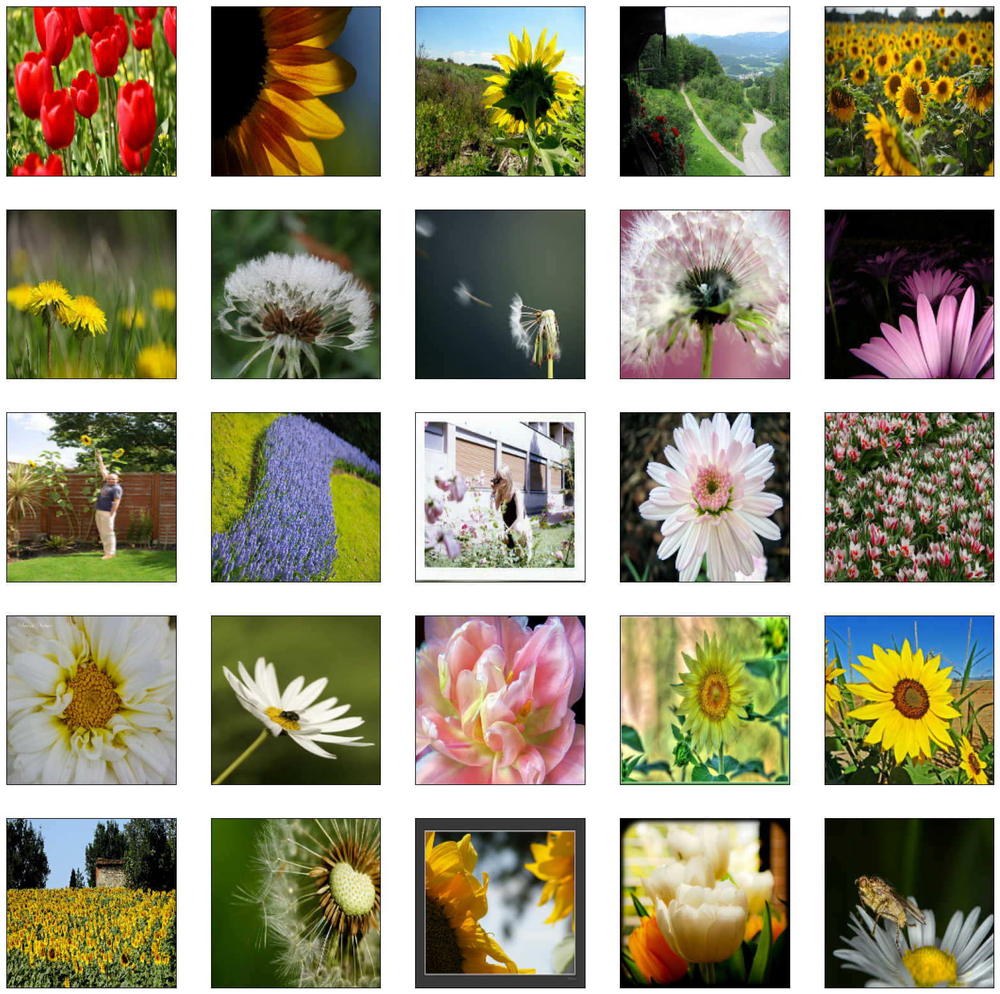

In [ ]:
import matplotlib.pyplot as plt #Para mostrar el set de datos
import cv2 #Necesario para convertir el tamaño de las imagenes
plt.figure(figsize=(20,20))
image_size = 180  #Ya que hay imagenes de distintos tamaños se deben normalizar ya que habran un numero fijo de neuronas de entrada

for i, (imagen, etiqueta) in enumerate (datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(),(image_size, image_size))
  #imagen = cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY) # Se trabajara en escala de grises para que sea mas simple el proceso de entrenamiento
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

In [ ]:
datos_entrenamiento = [] #Se crean los datos que se utilizaran para entrenar el las neuronas

In [ ]:
for i, (imagen, etiqueta) in enumerate (datos['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(),(image_size, image_size))
  imagen = imagen.reshape(image_size, image_size, 3) #Cambia el tamaño a 180,180,1
  datos_entrenamiento.append([imagen, etiqueta])

In [ ]:
len(datos_entrenamiento)

3670

In [ ]:
X = [] #Imagenes de entradas pixeles
y = [] #Etiquetas (tipos de flores)

for imagen, etiqueta in datos_entrenamiento: #Se separan los pixeles de las etiquetas
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
  import numpy as np
  X=np.array(X).astype(float) / 255 #Normalizacion de datos para que esten entre 0 y 1, ya que estan en escala de grises su mayor valor es 255

In [ ]:
y = np.array(y)

In [ ]:
#Realizar el aumento de datos con varias transformaciones.
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

#plt.figure(figsize=(20,8))

#for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
#  for i in range(10):
#    plt.subplot(2, 5, i+1)
#    plt.xticks([])
#    plt.yticks([])
#    plt.imshow(imagen[i].reshape(image_size, image_size), cmap="gray")
#  break

In [ ]:
#Modelo convolucional
num_classes = 5
modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(image_size, image_size, 3)),#Capa de entrada con 32 filtros de 3 x 3
  tf.keras.layers.MaxPooling2D(2, 2), #Capa de reduccion de tamaño 2 x 2 

  tf.keras.layers.Conv2D(64, (3,3), activation='relu'), #Capa de 64 filtros de 3 x 3 
  tf.keras.layers.MaxPooling2D(2, 2), #Capa de reduccion 2x2
  
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'), #Capa con 128 filtros 3x3
  tf.keras.layers.MaxPooling2D(2, 2), #Capa de reduccion 2 x 2

  tf.keras.layers.Dropout(0.5), #Apaga neuronas con posibilidad de 0.5
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(150, activation='relu'), #Capa oculta con 150 neuronas
  tf.keras.layers.Dense(num_classes, activation='softmax') #Capa de salida con el num_de clases como neuronas de salida
])

In [ ]:
modeloCNN_AD.compile(optimizer='adam',
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    metrics=['accuracy'])

In [ ]:
len(X) * .85 #3120
len(X) - 3120 #550
X_entrenamiento = X[:3120]
X_validacion = X[3120:]

y_entrenamiento = y[:3120]
y_validacion = y[3120:]

In [ ]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
import gc
gc.collect()

99604

In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs-new/cnn_AD

Reusing TensorBoard on port 6006 (pid 1382), started 1:34:27 ago. (Use '!kill 1382' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento, #genera nuevos datos.
    epochs=150 , batch_size=32, #numero de epocas y tamaño de lote
    validation_data=(X_validacion, y_validacion), #Los datos de validacion
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))), #numero de veces que se actualizan los pesos por epoca
    validation_steps=int(np.ceil(len(X_validacion) / float(32))), #Similar pero para el proceso de validacion
    callbacks=[tensorboardCNN_AD] #Guarda los logs para hacer graficos
)

Epoch 1/150


/usr/local/lib/python3.9/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


98/98 [==============================] - 39s 260ms/step - loss: 1.3272 - accuracy: 0.4244 - val_loss: 1.0419 - val_accuracy: 0.5582
Epoch 2/150
98/98 [==============================] - 24s 241ms/step - loss: 1.0675 - accuracy: 0.5667 - val_loss: 0.9049 - val_accuracy: 0.6291
Epoch 3/150
98/98 [==============================] - 23s 236ms/step - loss: 0.9716 - accuracy: 0.6147 - val_loss: 0.8383 - val_accuracy: 0.6764
Epoch 4/150
98/98 [==============================] - 24s 242ms/step - loss: 0.9077 - accuracy: 0.6385 - val_loss: 0.7855 - val_accuracy: 0.7000
Epoch 5/150
98/98 [==============================] - 24s 241ms/step - loss: 0.9147 - accuracy: 0.6378 - val_loss: 0.7790 - val_accuracy: 0.7018
Epoch 6/150
98/98 [==============================] - 24s 242ms/step - loss: 0.8707 - accuracy: 0.6513 - val_loss: 0.7845 - val_accuracy: 0.6982
Epoch 7/150
98/98 [==============================] - 24s 242ms/step - loss: 0.8294 - accuracy: 0.6779 - val_loss: 0.7371 - val_accuracy: 0.7145
Epoc

In [ ]:
class_names = ['Diente de leon', 'Margarita', 'Tulipan', 'Girasol', 'Rosa']

Saving tulips.png to tulips.png
1/1 [==============================] - 0s 350ms/step


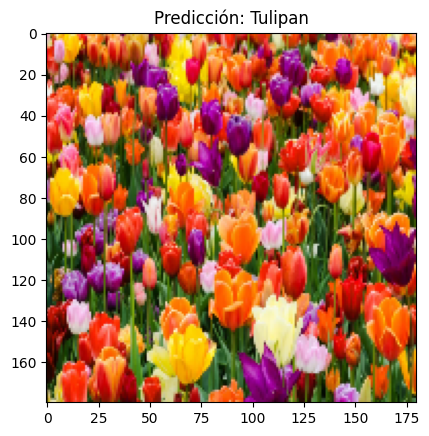

In [ ]:
#Subir una foto y establecer la flor

from google.colab import files
from IPython.display import clear_output
def predict_and_show(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(180, 180))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    predictions = modeloCNN_AD.predict(img_array)
    predicted_label = np.argmax(predictions)

    plt.figure()
    plt.imshow(img, cmap=plt.cm.binary)
    plt.title("Predicción: " + class_names[predicted_label])
    plt.show()
uploaded = files.upload()

for fn in uploaded.keys():
    predict_and_show(fn)
    clear_output(wait=True)

In [ ]:
#Exportar el modelo en formato h5
modeloCNN_AD.save('flores.h5')

In [ ]:
!pip install protobuf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached protobuf-3.19.6-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.1 MB)
  Using cached tensorflow-2.11.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (588.3 MB)
  Using cached tensorboard-2.11.2-py3-none-any.whl (6.0 MB)
  Using cached keras-2.11.0-py2.py3-none-any.whl (1.7 MB)
  Using cached tensorflow_estimator-2.11.0-py2.py3-none-any.whl (439 kB)
  Using cached tensorboard_data_server-0.6.1-py3-none-manylinux2010_x86_64.whl (4.9 MB)
  Using cached google_auth_oauthlib-0.4.6-py2.py3-none-any.whl (18 kB)
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.0
    Uninstalling tensorboard-da

In [ ]:
!pip install --upgrade tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 82.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 42.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 80.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.4/302.4 kB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 101.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.11.0
    Uninstalling tensorflow-estimator-2.11.0:
      Successfully uninstalled tensorflow-estimator-2.11.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.6.1
    Uninstalling tensorboard-data-server-0.6.1:
      Successfully uninstalled tensorboard-data-se

In [ ]:
!pip show tensorflowjs

Name: tensorflowjs
Version: 4.4.0
Summary: 
Home-page: https://js.tensorflow.org/
Author: Google LLC
Author-email: opensource@google.com
License: Apache 2.0
Location: /usr/local/lib/python3.9/dist-packages
Requires: flax, importlib_resources, jax, packaging, protobuf, six, tensorflow, tensorflow-decision-forests, tensorflow-hub
Required-by: 


In [ ]:
#Creamos una carpeta donde se colocara los archivos resultantes
!mkdir carpeta_salida

In [ ]:
#Realizar la exportacion a la carpeta de salida
!tensorflowjs_converter --input_format keras flores.h5 carpeta_salida/

2023-04-13 23:47:28.946349: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.9/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-04-13 23:47:28.946506: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.9/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-04-13 23:47:28.946537: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [ ]:
#Confirmar que en la carpeta de salida se haya generado los archivos bin y json
!ls carpeta_salida

group1-shard1of8.bin  group1-shard4of8.bin  group1-shard7of8.bin
group1-shard2of8.bin  group1-shard5of8.bin  group1-shard8of8.bin
group1-shard3of8.bin  group1-shard6of8.bin  model.json
